In [1]:
import pandas as pd
import json
import csv
from matplotlib import pyplot as plt
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
import numpy as np
import math

In [18]:
listings_back = pd.read_csv("listings.csv", encoding = "UTF-8")

In [ ]:
#DEFINITIONS
#Occupancy is an average score generated over the last year + upcoming bookings
#Nights booked is over the last year
#Mashvisor started integrating with AirBnB since the first day we founded the company - late 2014. 
#We have data for all U.S listings in a location, storing all listing detailed info, reviews, photos, 
#host info, and yearly calendar for day per day booking availability and booking price per night. We 
#currently having 2M+ listings available in our database.Mashvisor also developed an occupancy calculator 
#algotherm evolved over the last 5 years calculating the occupancy rate for each listing month by month upon 
#its historical performance and available future bookings. Our algorithms could currently distinguish between 
#booked days and blocked days from booking, also calculate the estimated monthly rental income for the listings 
#for future predictions, and availability to provide rental incomes for all the past months for the listing history. 
#Moreover, we’ve implemented different mathematical algorithms helping us into our calculations, and we’re working 
#on a new machine learning algorithms would help determining listings outliers, calculated occupancy rates.
#Recently, we started the process of reviewing our occupancy rates calculations with verified AirBnB hosts who have 
#multiple listings over there to guarantee better service introduced for our customers and superiority over our main 
#competitor AirDna. States breakdown coverage is attached in appendix D.

In [4]:
listings_back.isnull().sum()

id                           0
property_id                  0
source                       0
status                       0
night_priceـnative           0
night_price                  0
weekly_price                 0
monthly_price                0
cleaning_fee_native         27
num_of_baths                 0
num_of_rooms                 1
occupancy                    0
nights_booked                0
rental_income                0
airbnb_neighborhood_id       0
name                         0
address                      0
airbnb_neighborhood          4
airbnb_city                  0
state                        0
capacity_of_people           0
zip                         10
property_type                0
room_type                    0
room_type_category           0
amenities                 1520
reviews_count                0
start_rating                 7
reviews                   1520
created_at                   0
updated_at                   0
num_of_beds                  2
lat     

In [58]:
drops = ["amenities", "reviews", "url"]
listings_back = listings_back.drop(drops, axis = 1)

####Removing 2 observations missing bed count
listings_back = listings_back[~listings_back['num_of_beds'].isnull()]

####Removing 10 observations zip
listings_back = listings_back[~listings_back['zip'].isnull()]

####Removing 4 observations missing neighborhood
listings_back = listings_back[~listings_back['airbnb_neighborhood'].isnull()]

####Removing 7 observations start_rating
listings_back = listings_back[~listings_back['start_rating'].isnull()]

####imputing 0 consistent with missing num of rooms type
####https://www.airbnb.ca/rooms/44503022?source_impression_id=p3_1602010086_Tl4dh9Fvpnn5ZRqK
listings_back.loc[listings_back.num_of_rooms.isnull() == True, "num_of_rooms"] = 0

####27 properties are missing a cleaning fee and no properties have a $0 cleaning fee, so I'm assuming that
####a missing value indicates 0
listings_back.loc[listings_back.cleaning_fee_native.isnull() == True, 'cleaning_fee_native'] = 0

proc_listings_csv_data = listings_back.to_csv('post_imputation_listings.csv', index = False) 

In [ ]:
listings_back
plt.hist(detailed_listings_back["check_in_time"])

# Detailed Listings Formatting and Variance Filtering

In [2]:
#These functions help transform the ammenities column from a list-like string to a list that MultiLabelBinarizer can work on
def strip_split(x):
    return x.strip("[]' ").split(",")

def striper(x):
    return x.strip("[]' ")

def formater(x):
    alist = list(map(strip_split, x))
    blist = []
    for i in range(0,len(alist)):
        blist.append(list(map(striper, alist[i])))
    return blist

In [3]:
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer


detailed_listings_back = pd.read_csv("detailed_listings.csv", encoding = "UTF-8")
detailed_listings_back.columns = detailed_listings_back.columns.str.replace("content.","")
detailed_listings_back.city = detailed_listings_back.city.str.strip()

s = detailed_listings_back['amenities']
mlb = MultiLabelBinarizer()
ammenities_df = pd.DataFrame(mlb.fit_transform(formater(s)),columns=mlb.classes_, index=detailed_listings_back.index)

##Remove columns with variance below log of dataframe height
lVarDrops = ammenities_df.var() < 0 #(math.log(ammenities_df.shape[0])/1497)
ammenities_df = ammenities_df[ammenities_df.columns[~lVarDrops]]

#Join w/listings
detailed_listings_back = detailed_listings_back.join(ammenities_df)

In [4]:
print("Ammenities dropped for low variance are:")
lVarDrops.iloc[lVarDrops.values == True].keys()

Ammenities dropped for low variance are:


Index([], dtype='object')

# Missing Value Imputation

In [5]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
print("Dataset shape is " + str(detailed_listings_back.shape))
missingCells = np.sum(detailed_listings_back.isnull().sum()) 
print(str(missingCells) + " null cells in dataset")
print(str(missingCells/detailed_listings_back.shape[0]/detailed_listings_back.shape[1]) + "% of dataset is null")

Dataset shape is (1497, 283)
25057 null cells in dataset
0.05914538145785092% of dataset is null


In [6]:
#Drops for relevance: status, id,picture_url, thumbnail_url, medium_url,xl_picture_url, country, country_code,
#market, state, bed_type (identical to bed_type_category), amenities (unnescesary after binarization), 
#native_price(identical to price), price_formatted(formatted as string), security_deposit_formatted (formatted as string)
#security_price_native(identical to security_deposit_native), smart_location(identical to city), address (identical to city)
#loc.coordinates(identical to lat,lng), localized_city(identical to city), airbnb_id(each one is unique), mashvisor_id(each is unique)
#host_id(identical to user_id), listing_monthly_price_native (identical to monthly_price_native),
#listing_weekly_price_native (identical to weekly_price_native), extras_price_native (identical to cleaning_fee_native),
#listing_cleaning_fee_native(identical to cleaning_fee_native), language(identical to locale), Other (Not meaningful)

#Drops for simplicity: name, public_address, house_rules, description, summary, space, access, interaction, transit,
#neighborhood_overview

#Drops where 80% or better of data is missing:is_business_travel_ready 

detailed_drops = ["status","id","price_native", "price_formatted", "picture_url", "thumbnail_url", "name",
                  "medium_url", "xl_picture_url", "security_deposit_formatted", "smart_location", "address",
                  "country","country_code","security_price_native", "is_business_travel_ready",
                  "listing_monthly_price_native","listing_weekly_price_native", "extras_price_native",
                  "listing_cleaning_fee_native","language", "Other",
                 "market", "state","currency_symbol_right", "license","square_feet", "map_image_url",
                  "has_viewed_terms","has_viewed_cleaning", "has_viewed_ib_perf_dashboard_panel","special_offer",
                  "toto_opt_in","wireless_info", "amenities", "bed_type", "public_address", "house_rules",
                  "description", "summary", "space", "access", "interaction", "loc.coordinates","airbnb_id",
                  "mashvisor_id", "localized_city", "public_address", "house_rules", "description", "summary",
                 "space", "access", "interaction", "transit", "neighborhood_overview", "host_id"]
for detailed_drop in detailed_drops:
    if detailed_drop in detailed_listings_back.columns:
        detailed_listings_back = detailed_listings_back.drop(detailed_drop, axis = 1)

for i in detailed_listings_back.columns:
    if len(detailed_listings_back[i].unique()) == 1:
        if np.any(detailed_listings_back[i].isnull()) == False:
            detailed_listings_back = detailed_listings_back.drop(i, axis = 1)
        
detailed_listings_back



,city,user_id,price,lat,lng,instant_bookable,bedrooms,beds,bathrooms,min_nights,neighborhood,person_capacity,zipcode,cancellation_policy,property_type,reviews_count,picture_count,bed_type_category,require_guest_profile_picture,require_guest_phone_verification,cancel_policy,check_in_time,check_out_time,guests_included,max_nights,locale,has_agreed_to_legal_terms,max_nights_input_value,min_nights_input_value,property_type_id,security_deposit_native,description_locale,is_location_exact,cancel_policy_short_str,star_rating,price_for_extra_person_native,weekly_price_native,monthly_price_native,created_at,updated_at,cleaning_fee_native,instant_book_enabled,listing_price_for_extra_person_native,listing_weekend_price_native,monthly_price_factor,weekly_price_factor,occupancy,rental_income,nights_booked,24-hour check-in,Accessible-height bed,Accessible-height toilet,Air conditioning,Amazon Echo,BBQ grill,Baby bath,Baby monitor,Babysitter recommendations,Baking sheet,Balcony,Barbecue utensils,Bath towel,Bathroom essentials,Bathtub,Beach essentials,Bed linens,Bedroom comforts,Body soap,Bread maker,Breakfast,Breakfast table,Building staff,Buzzer/wireless intercom,Cable TV,Carbon monoxide alarm,Carbon monoxide detector,Cat(s),Ceiling fan,Central air conditioning,Changing table,Children’s books and toys,Children’s dinnerware,Cleaning before checkout,Coffee maker,Conditioner,Convection oven,Cooking basics,Crib,DVD player,Day bed,Disabled parking spot,Dishes and silverware,Dishwasher,Dog(s),Dryer,EV charger,Elevator,En suite bathroom,Espresso machine,Essentials,Ethernet connection,Extra pillows and blankets,Extra space around bed,Family/kid friendly,Fire extinguisher,Fire pit,Fireplace guards,Firm mattress,First aid kit,Fixed grab bars for shower,Flat path to guest entrance,Formal dining area,Free parking on premises,Free street parking,Freezer,Full kitchen,Game console,Garden or backyard,Gas oven,Gym,HBO GO,Hair dryer,Hand Sanitiser,Handheld shower head,Hangers,Heat lamps,Heated floors,Heating,High chair,Host greets you,Hot tub,Hot water,Hot water kettle,Indoor fireplace,Internet,Iron,Jetted tub,Keurig coffee machine,Keypad,Kitchen,Kitchenette,Laptop friendly workspace,Laptop-friendly workspace,Laundromat nearby,Lock on bedroom door,Lockbox,Long term stays allowed,Luggage dropoff allowed,Memory foam mattress,Microwave,Mini fridge,Mudroom,Murphy bed,Nespresso machine,Netflix,No stairs or steps to enter,Other pet(s),Outdoor parking,Outdoor seating,Outlet covers,Oven,Pack ’n Play/travel crib,Paid parking off premises,Paid parking on premises,Patio or balcony,Pets allowed,Pets live on this property,Piano,Pillow-top mattress,Playground,Pocket wifi,Pool,Portable fans,Pour Over Coffee,Printer,Private entrance,Private living room,Rain shower,Record player,Refrigerator,Rice Maker,Roll-in shower,Room-darkening shades,Safety card,Self check-in,Shampoo,Shower gel,Single level home,Smart TV,Smart lock,Smoke alarm,Smoke detector,Smoking allowed,Soaking tub,Sound system,Stair gates,Stove,Suitable for events,TV,Table corner guards,Terrace,Toilet paper,Trash can,Trash compacter,Walk-in shower,Washer,Waterfront,Well-lit path to entrance,Wheelchair accessible,Wide clearance to shower,Wide doorway to guest bathroom,Wide entrance,Wide entrance for guests,Wide entryway,Wide hallways,Wifi,Window guards,toilet,translation missing: en.hosting_amenity_49,translation missing: en.hosting_amenity_50
0,Philadelphia,6338241,295,39.96928,-75.14747,False,3.0,3,1.5,2,Poplar,6,19123,flexible,House,35,15,real_bed,False,False,3,NaN,NaN,7,1125,en,True,NaN,2.0,2,475.0,en,True,Flexible,5.0,0,NaN,NaN,2018-05-31T08:02:23.747Z,2020-09-25T06:44:16.241Z,85.0,False,0,NaN,0.7500,0.8500,4.0,379.0,9.0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,

# Normalizing City Names

In [7]:
detailed_listings_back['city'] = detailed_listings_back['city'].replace(['Passyunk Square, Philadelphia'],'Philadelphia')

In [8]:
print(detailed_listings_back.city.unique())
sum(detailed_listings_back.city == 'Passyunk Square, Philadelphia')

['Philadelphia' 'Bala Cynwyd' nan 'Elkins Park' 'Yeadon' 'Eddington'
 'Wyncote']


0

# Reformat created_at and updated_at columns

In [9]:
#Imputed creation date to observations that have no update date
if 'updated_at' in detailed_listings_back:
    detailed_listings_back['updated_at'] = detailed_listings_back['updated_at'].replace(np.nan, detailed_listings_back['created_at'])
#    detailed_listings_back['date_updated'] = detailed_listings_back['updated_at'].str.split('T', expand=True)[0]
#    detailed_listings_back['time_updated'] = detailed_listings_back['updated_at'].str.split('T', expand=True)[1]
#    detailed_listings_back['time_updated'] = detailed_listings_back['time_updated'].str.split('.', expand=True)[0]
#    detailed_listings_back.drop(axis = 1, labels = 'updated_at')
    
#if 'created_at' in detailed_listings_back:
#    detailed_listings_back['date_created'] = detailed_listings_back['created_at'].str.split('T', expand=True)[0]
#    detailed_listings_back['time_created'] = detailed_listings_back['created_at'].str.split('T', expand=True)[1]
#    detailed_listings_back['time_created'] = detailed_listings_back['time_created'].str.split('.', expand=True)[0]
#    detailed_listings_back.drop(axis = 1, labels = 'created_at')
    
#detailed_listings_back

# Proportion of Missing Rows in Each Column (NaN/NA)

(array([212.,   1.,   4.,   0.,   0.,   1.,   0.,   0.,   0.,   2.]), array([0.        , 0.09485638, 0.18971276, 0.28456914, 0.37942552,
       0.4742819 , 0.56913828, 0.66399466, 0.75885104, 0.85370741,
       0.94856379]), <a list of 10 Patch objects>)
city                                          0.000668
user_id                                       0.000000
price                                         0.000000
lat                                           0.000000
lng                                           0.000000
instant_bookable                              0.000000
bedrooms                                      0.000668
beds                                          0.000000
bathrooms                                     0.000000
min_nights                                    0.000000
neighborhood                                  0.000000
person_capacity                               0.000000
zipcode                                       0.000000
cancellation_policy           

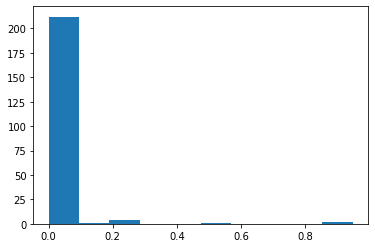

In [10]:
print(plt.hist(detailed_listings_back.isnull().sum()/detailed_listings_back.shape[0]))
print(detailed_listings_back.isnull().sum()/detailed_listings_back.shape[0])

In [11]:
from sklearn.impute import KNNImputer
import statistics
#Removing very inconsequential missing values. THIS LINE NEEDS TO BE ACTIVATED BEFORE USE!!!
lmDrops = math.log10(len(detailed_listings_back))/detailed_listings_back.shape[0]
detailed_listings_back.dropna(axis = 0, subset = detailed_listings_back.columns[detailed_listings_back.isnull().sum()/len(detailed_listings_back) <= lmDrops].to_list()).shape

#Imputed description_locale to rows where locale was NA
detailed_listings_back['locale'] = detailed_listings_back['locale'].replace(np.nan, detailed_listings_back['description_locale'])

#imputing normal daily price to observations with no weekly rate
#detailed_listings_back['weekly_price_native'] = detailed_listings_back['weekly_price_native'].replace(np.nan, detailed_listings_back['price'] * 7)

#imputing normal daily price to observations with no monthly rate
#detailed_listings_back['monthly_price_native'] = detailed_listings_back['monthly_price_native'].replace(np.nan, detailed_listings_back['price'] * 30.42)

#imputing normal daily price to observations with no weekend rate
#detailed_listings_back['listing_weekend_price_native'] = detailed_listings_back['listing_weekend_price_native'].replace(np.nan, detailed_listings_back['price'])

#max_nights_input_values has lots ot NA values but no zeroes, so I'm taking that as infinity
#detailed_listings_back['max_nights_input_value'] = detailed_listings_back['max_nights_input_value'].replace(np.nan, float("inf"))

#min_nights_input_values has lots ot NA values but no zeroes, so I'm taking that as 1.
#I don't think AirBnb rents by the hour anyway :)
detailed_listings_back['min_nights_input_value'] = detailed_listings_back['min_nights_input_value'].replace(np.nan, 1)

###NAs in these three seem to be connected. Deleting all rows with NAs in occupancy results in removal of all rows with
###NAs in the other two and only one row with an NA in occupancy has a value in rental income, which was very low

#occupancy has lots ot NA values but no zeroes, so I'm taking that as 0.
detailed_listings_back['occupancy'] = detailed_listings_back['occupancy'].replace(np.nan, 0)

#nights_booked has lots ot NA values but no zeroes, so I'm taking that as 0.
detailed_listings_back['nights_booked'] = detailed_listings_back['nights_booked'].replace(np.nan, 0)

#rental_income has lots ot NA values but no zeroes, so I'm taking that as 0.
detailed_listings_back['rental_income'] = detailed_listings_back['rental_income'].replace(np.nan, 0)

In [60]:
proc_detailed_listings_csv_data = detailed_listings_back.to_csv('l1_detailed_listings.csv', index = False) 